#1.Importar Librerias

In [78]:
import pandas as pd ### para manejo de datos
import sqlite3 as sql
from sklearn import linear_model ## para regresión lineal
from sklearn import tree ###para ajustar arboles de decisión
from sklearn.ensemble import RandomForestRegressor ##Ensamble con bagging
from sklearn.ensemble import GradientBoostingRegressor ###Ensamble boosting
from sklearn.model_selection import cross_val_predict, cross_val_score, cross_validate
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso
from sklearn.metrics import mean_squared_error,mean_absolute_error, mean_squared_error, r2_score
from matplotlib.pyplot import figure
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
import seaborn as sns
from sklearn.feature_selection import SelectFromModel
pd.options.display.max_columns=None
pd.options.display.max_rows=None
import numpy as np
import matplotlib.pyplot as plt ### gráficos
from sklearn.model_selection import RandomizedSearchCV
import joblib  ### para guardar modelos
from sklearn.preprocessing import StandardScaler,LabelEncoder, OneHotEncoder ## escalar variables
import openpyxl

#2.Lectura y verificacion de datos

In [2]:
#Se importa base de datos resultante del pre_procesamiento
df_egr_final = pd.read_csv("df_egresos_final.csv")

In [3]:
#se crea copia del df
df_egr_final1=df_egr_final.copy()

In [4]:
df_egr_final1.head(3)

,NRODOC,SEXO,MUNICIPIO,BARRIO,PRIMERA CLASE FUNCIONAL,ÚLTIMA CLASE FUNCIONAL,Clasificación IMC,Calificación (Índice de Fragilidad),Calificación (Apoyo Monopodal),Calificación Velocidad,Test Findrisc,Índice Tobillo/Brazo,Presión arterial registro medico,Diabetes Mellitus,Tipo diabetes mellitus,Tiempo con el diagnóstico,Control Diabetes,Tiene HTA,Control HTA,Tiene riesgo de tener HTA,Tiempo con el diagnóstico1,Tiene EPOC,Enfermedad Coronaria (En el último año),Insuficiencia Cardíaca,Valvulopatía,Arritmia o paciente con dispositivo,Sufre de alguna enfermedad cardiovascular,Tabaquismo,Cuantos cigarrillos día,Clasificación de Framinghan,Estadio de la Enfermedad Renal,Clase Funcional,Basciloscopia,Úlcera de pie diabético,Remisión,Diagnóstico Principal,Análisis y conducta a seguir,Tiene próximo control,Tipo control,Requiere cita de morbilidad,Ambito según el médico,Atención,Ingreso,Peso,Talla,IMC,Saturación de Oxígeno (%),Perímetro Muslo,Perímetro Cintura,Pliegue Triceps,Pliegue Abdomen,Pliegue Muslo,Sumatoria Pliegues,Presión Arterial Sistólica,Presión Arterial Diastólica,Frecuencia Cardíaca en reposo,Auto-calificacion Nivel de Ejercicio,Constantes,METS -Índice Metabólico,VO2 - Máxima Cantidad de Oxígeno,Índice de Fragilidad Groningen,Tiempo en Segundos (Apoyo Monopodal),Tiempo en Segundos (Recorrer 5 metros),Velocidad (m/s),Glicemia,Hemoglobina Glicada,Años de Consumo,Lipoproteina,HDL,Colesterol total,Trigliceridos,Creatinina 1 consulta,Tasa de Filtración Glomerular TFG,Microalbuminuria,Hormona Estimulante de la Tiroides (TSH),Creatinina 2 consulta,Tasa de Filtración Glomerular TFG2,Meses de diferencia entre TFG,Cambio de TFG,YEAR,MES,SERVICIO HABILITADO COD,REGIMEN AFILIACION,EPS VALIDADA,MODALIDAD CONTRATO,FUENTE FINANCIACION1,FUENTE FINANCIACION2,SERVICIO ADMITE,VIA INGRESO,BLOQUE,UNIDAD ESTRATEGICA,PISO,NRO CAMA,SERVICIO EGRESO,TIPO EGRESO,DEMORA ASIGNACION CAMA,DEMORA APLICACION MEDICAMENTO,DEMORA SALIDA CLINICA (DIAS),TRANSFUSION SANGRE,ANTIBIOTICO,ALTA MEDICA,DX RELACIONADO1 COD,DX RELACIONADO2 COD,DX RELACIONADO3 COD,DX PRINCIPAL EGRESO CAPITULO COD,PROFESIONAL ESPECIALIDAD,PROFESIONAL ESPECIALIDAD GRD,EDAD,estancia
0,306222,F,MEDELLIN,PRADO CENTRO,CLASE FUNCIONAL 2A,CLASE FUNCIONAL 2A,Obesidad Grasa,Normal,Malo - Fragil,Aceptable,Alta Probabilidad de Diabetes,0.91 - 1.30 Normal,120/65/Sentado,No,ND,ND,No aplica,Si,Controlada,No aplica,ND,No,No aplica,No aplica,No,Si,Si,No,ND,Bajo riesgo,Estadio 0,Clase funcional 2A,No aplica,No,Grupal 2,I10X - HIPERTENSION ESENCIAL (PRIMARIA),Comprometidos con la seguridad de nuestros pac...,ND,Médico,ND,Ambulatorio,5.036516e+06,3.394202e+06,74.666667,158.666667,29.7050,95.166667,45.333333,102.666667,19.0,38.666667,27.333333,85.000,117.833333,69.833333,64.333333,1.333333,0.106667,6.680150,23.380500,3.1666666666666665,1.500,4.833333,0.773333,90.33333333333333,2.6,0.0,39.666666666666664,46.53333333333333,112.53333333333335,64.5,0.6633333333333333,140.85166666666666,3.4,0.7933333333333333,0.8333333333333334,68.94333333333333,0.0,0.0,2021,8,101.0,Contributivo,NUEVA EPS S.A. PGP,PGP,NUEVA EPS,NUEVA EPS,Hospitalización,Consulta Externa ó Programada,Bloque 1,Hospitalizacion Adultos,Piso 5,527AN,Piso 5 Medicina Interna Norte,Alta Médica,1:38,-82:00,0.0,NO,NO,SI,I878,G401,G438,I00-I99,Medicina Interna,Medicina Interna,47.0,3.0
1,306223,F,MEDELLIN,SAMARIA,CLASE FUNCIONAL 4,CLASE FUNCIONAL 4,Obesidad Grasa,Frágil,Malo - Fragil,Malo - Frágil,Alta Probabilidad de Diabetes,0.91 - 1.30 Normal,Sin información,No,ND,ND,No aplica,No,No aplica,Alto riesgo,ND,No,No,No,No,No,No,Si,40,Bajo riesgo,Estadio 0,Clase funcional 4,No aplica Negativo,No,Grupal 4,F028 - DEMENCIA EN OTRAS ENFERMEDADES ESPECIFI...,1. Control medico en un mes con resultado de p...,ND,Médico,ND,Domiciliario,4.758786e+06,2.997755e+06,74.000000,159.000000,29.3300,95.000000,37.000000,107.000000,9.0,12.000000,9.000000,30.000,121.000000,79.500000,69.000000,1.000000,0.000000,4.963900,17.373650,12.0,0.000,0.000000,0.000000,40.5,2.93,30.0,0.0,19.89

In [5]:
#eliminamos columna de NRODOC ya que es como un index y no aporta al modelo.
df_egr_final1.drop(["NRODOC"],axis=1,inplace=True)
df_egr_final1.drop(["Análisis y conducta a seguir"],axis=1,inplace=True)

In [6]:
#valores nulos
print("###Valores nulos###\n",df_egr_final1.isnull().sum(),"\n") #vemos que no tenemos valores nulos
#valores diferentes por columna
print("###categorias por columna###\n",df_egr_final1.nunique())
#tipo de datos
print("###Tipos de datos###\n",df_egr_final1.dtypes)#vemos uqe los datos son numericos y categoricos o tipo object

###Valores nulos###
 SEXO                                         0
MUNICIPIO                                    0
BARRIO                                       0
PRIMERA CLASE FUNCIONAL                      0
ÚLTIMA CLASE FUNCIONAL                       0
Clasificación IMC                            0
Calificación (Índice de Fragilidad)          0
Calificación (Apoyo Monopodal)               0
Calificación Velocidad                       0
Test Findrisc                                0
Índice Tobillo/Brazo                         0
Presión arterial registro medico             0
Diabetes Mellitus                            0
Tipo diabetes mellitus                       0
Tiempo con el diagnóstico                    0
Control Diabetes                             0
Tiene HTA                                    0
Control HTA                                  0
Tiene riesgo de tener HTA                    0
Tiempo con el diagnóstico1                   0
Tiene EPOC                             

#3.Transformacion de variables categoricas

In [7]:
le=LabelEncoder() #es el mas adecuado para variable respuesta.

In [8]:
#hacemos una lista de variables numericas y catericas
col_obj=[]
col_num=[]
for columna in df_egr_final1.columns:
    if df_egr_final1[columna].dtype == 'object':
        col_obj.append(columna)
    else:
        col_num.append(columna)

In [9]:
#transformamos variables categoricas a dummies
df_egr_final_dummies=pd.get_dummies(df_egr_final1,columns=col_obj)

In [10]:
df_egr_final_dummies.head(2)

,Atención,Ingreso,Peso,Talla,IMC,Saturación de Oxígeno (%),Perímetro Muslo,Perímetro Cintura,Pliegue Triceps,Pliegue Abdomen,Pliegue Muslo,Sumatoria Pliegues,Presión Arterial Sistólica,Presión Arterial Diastólica,Frecuencia Cardíaca en reposo,Auto-calificacion Nivel de Ejercicio,Constantes,METS -Índice Metabólico,VO2 - Máxima Cantidad de Oxígeno,Tiempo en Segundos (Apoyo Monopodal),Tiempo en Segundos (Recorrer 5 metros),Velocidad (m/s),YEAR,MES,SERVICIO HABILITADO COD,DEMORA SALIDA CLINICA (DIAS),EDAD,estancia,SEXO_F,SEXO_M,MUNICIPIO_BELLO,MUNICIPIO_COPACABANA,MUNICIPIO_EL PORVENIR,MUNICIPIO_ENVIGADO,MUNICIPIO_ITAGUI,MUNICIPIO_LA ESTRELLA,MUNICIPIO_MEDELLIN,MUNICIPIO_SABANETA,MUNICIPIO_SAN ANTONIO DE PRADO,MUNICIPIO_SAN CRISTOBAL,MUNICIPIO_SAN FELIX,MUNICIPIO_SANTA ELENA,MUNICIPIO_Sin información,MUNICIPIO_VEREDA LA MARIA,MUNICIPIO_VEREDA YARUMALITO,BARRIO_ ENCISO COTIZ,BARRIO_12 DE OCTUBRE,BARRIO_20 DE JULIO,BARRIO_ACEVEDO,BARRIO_ALCALÁ,BARRIO_ALFONSO LOPEZ,BARRIO_ALTO DE LAS FLORES,BARRIO_AMAGA SANTANDER,BARRIO_ANDALUCIA,BARRIO_ANDALUCIA LA FRANCIA,BARRIO_ANTONIO NARIÑO,BARRIO_ARANJUEZ,BARRIO_ARANJUEZ ANILLO,BARRIO_ARANJUEZ PALERMO PARTE BAJA,BARRIO_ASTURIAS,BARRIO_BARRIO CENTRAL,BARRIO_BARRIO COLOMBIA,BARRIO_BARRIO NUEVO,BARRIO_BARRIO PEREZ,BARRIO_BELARCAZAR,BARRIO_BELEN,BARRIO_BELEN ALAMEDA,BARRIO_BELEN ALIADAS,BARRIO_BELEN ALTAVISTA,BARRIO_BELEN KENNEDY,BARRIO_BELEN LA GLORIA,BARRIO_BELEN LA MOTA,BARRIO_BELEN LA NUBIA,BARRIO_BELEN LA PALMA,BARRIO_BELEN LAS MERCEDES,BARRIO_BELEN LAS VILOLETAS,BARRIO_BELEN LAS VIOLETAS,BARRIO_BELEN MERCE,BARRIO_BELEN RINCON,BARRIO_BELEN RODEO ALTO,BARRIO_BELEN ROSALES,BARRIO_BELEN SAN BERNARDO,BARRIO_BELEN ZAFRA,BARRIO_BELENCITO,BARRIO_BELENCITO CORAZON,BARRIO_BELLO,BARRIO_BELLO - BARRIO NUEVO,BARRIO_BELLO - BELLAVISTA,BARRIO_BELLO - EL TRAPICHE,BARRIO_BELLO - GRAN AVENIDA,BARRIO_BELLO - MANCHESTER,BARRIO_BELLO - MIRADOR,BARRIO_BELLO - PACHELLY,BARRIO_BELLO - PARIS,BARRIO_BELLO - PEREZ,BARRIO_BELLO - SAN JOSE OBRERO,BARRIO_BELLO - SANTA ANA,BARRIO_BELLO - SANTA RITA,BARRIO_BELLO BARRIO NUEVO,BARRIO_BELLO BELLAVISTA,BARRIO_BELLO CABAÑAS,BARRIO_BELLO CABAÑITAS,BARRIO_BELLO CAIRO,BARRIO_BELLO EL MIRADOR,BARRIO_BELLO FONTIDUEÑO,BARRIO_BELLO GRAN AVENIDA,BARRIO_BELLO LA CUMBRE,BARRIO_BELLO LA GRAN AVENIDA,BARRIO_BELLO LAS VEGAS,BARRIO_BELLO MIRADO,BARRIO_BELLO OBRERO,BARRIO_BELLO PACHELY,BARRIO_BELLO PLAYA RICA,BARRIO_BELLO SALVADOR,BARRIO_BELLO ZAMORA,BARRIO_BERLARCAZAR,BARRIO_BLANQUIZAL,BARRIO_BOMBONA,BARRIO_BOSTON,BARRIO_BOSTON,BARRIO_BOYACA LAS BRISAS,BARRIO_BUENOS AIRES,BARRIO_CABAÑAS BELLO,BARRIO_CAICEDO,BARRIO_CAICEDO LAS PERLAS,BARRIO_CALASANZ,BARRIO_CAMPO AMOR,BARRIO_CAMPO VALDES,BARRIO_CARPINELO,BARRIO_CASTILLA,BARRIO_CASTILLA LA UNION,BARRIO_CATALUÑA,BARRIO_CENTRAL,BARRIO_CENTRO,BARRIO_CENTRO PRADO,BARRIO_CIUDAD DEL RIO,BARRIO_COLINAS DE ENCISO,BARRIO_CONGOLO,BARRIO_CONQUISTADORES,BARRIO_COPACABANA,BARRIO_CORDOBA,BARRIO_CRISTOBAL EN AMERICA,BARRIO_Cairo Bello,BARRIO_DITAIRES,BARRIO_DOCE DE OCTUBRE,BARRIO_EL BOSQUE,BARRIO_EL CARMELO,BARRIO_EL CARRETERO,BARRIO_EL CHAGUALO,BARRIO_EL OBRERO,BARRIO_EL PARAISO,BARRIO_EL PICACHO,BARRIO_EL PINAL,BARRIO_EL PLAYON,BARRIO_EL POBLADO,BARRIO_EL PORVENIR,BARRIO_EL PROGRESO,BARRIO_EL RODEO,BARRIO_EL ROSARIO,BARRIO_EL SALADO,BARRIO_EL SALVADOR,BARRIO_EL VELODROMO,BARRIO_ENCISO,BARRIO_ENVIGADO,BARRIO_ENVIGADO ALCALÁ,BARRIO_ENVIGADO BARRIO MESA,BARRIO_ENVIGADO EL DORADO,BARRIO_ENVIGADO EL TRIANON,BARRIO_ENVIGADO GUANTEROS,BARRIO_ENVIGADO LA FLORIDA,BARRIO_ENVIGADO LA PAZ,BARRIO_ENVIGADO LAS FLORES,BARRIO_ENVIGADO SAN JOSE,BARRIO_ENVIGADO SAN RAFAEL,BARRIO_ENVIGADO VALLEJUELOS,BARRIO_ENVIGADO ZUÑIGA,BARRIO_ESPIRITU SANTO,BARRIO_ESTACION VILLA,BARRIO_ESTADIO,BARRIO_ESTADIO,BARRIO_ESTRELLA,BARRIO_FLORENCIA,BARRIO_FLORIDA NUEVA,BARRIO_FRANCISCO ANTONIO ZEA,BARRIO_GALAN,BARRIO_GIRARDOT,BARRIO_GRANIZAL,BARRIO_GRANJA,BARRIO_GUAYABAL,BARRIO_GUAYABAL,BARRIO_GUAYABAL BARRIO LA COLINA,BARRIO_GUAYABAL CRISTO REY,BARRIO_GUAYABAL LA COLINITA,BARRIO_GUAYABAL RODEO,BA

In [11]:
#transformacion de variable independiente
label=le.fit(df_egr_final_dummies["estancia"])
df_egr_final_dummies["estancia_enc"]=label.transform(df_egr_final_dummies["estancia"])
#se elimina variable respuesta sin encoder
df_egr_final_dummies.drop(["estancia"],axis=1,inplace=True)
if "estancia" in col_num:
    col_num.remove("estancia")

In [12]:
df_egr_final_dummies.head(2)

,Atención,Ingreso,Peso,Talla,IMC,Saturación de Oxígeno (%),Perímetro Muslo,Perímetro Cintura,Pliegue Triceps,Pliegue Abdomen,Pliegue Muslo,Sumatoria Pliegues,Presión Arterial Sistólica,Presión Arterial Diastólica,Frecuencia Cardíaca en reposo,Auto-calificacion Nivel de Ejercicio,Constantes,METS -Índice Metabólico,VO2 - Máxima Cantidad de Oxígeno,Tiempo en Segundos (Apoyo Monopodal),Tiempo en Segundos (Recorrer 5 metros),Velocidad (m/s),YEAR,MES,SERVICIO HABILITADO COD,DEMORA SALIDA CLINICA (DIAS),EDAD,SEXO_F,SEXO_M,MUNICIPIO_BELLO,MUNICIPIO_COPACABANA,MUNICIPIO_EL PORVENIR,MUNICIPIO_ENVIGADO,MUNICIPIO_ITAGUI,MUNICIPIO_LA ESTRELLA,MUNICIPIO_MEDELLIN,MUNICIPIO_SABANETA,MUNICIPIO_SAN ANTONIO DE PRADO,MUNICIPIO_SAN CRISTOBAL,MUNICIPIO_SAN FELIX,MUNICIPIO_SANTA ELENA,MUNICIPIO_Sin información,MUNICIPIO_VEREDA LA MARIA,MUNICIPIO_VEREDA YARUMALITO,BARRIO_ ENCISO COTIZ,BARRIO_12 DE OCTUBRE,BARRIO_20 DE JULIO,BARRIO_ACEVEDO,BARRIO_ALCALÁ,BARRIO_ALFONSO LOPEZ,BARRIO_ALTO DE LAS FLORES,BARRIO_AMAGA SANTANDER,BARRIO_ANDALUCIA,BARRIO_ANDALUCIA LA FRANCIA,BARRIO_ANTONIO NARIÑO,BARRIO_ARANJUEZ,BARRIO_ARANJUEZ ANILLO,BARRIO_ARANJUEZ PALERMO PARTE BAJA,BARRIO_ASTURIAS,BARRIO_BARRIO CENTRAL,BARRIO_BARRIO COLOMBIA,BARRIO_BARRIO NUEVO,BARRIO_BARRIO PEREZ,BARRIO_BELARCAZAR,BARRIO_BELEN,BARRIO_BELEN ALAMEDA,BARRIO_BELEN ALIADAS,BARRIO_BELEN ALTAVISTA,BARRIO_BELEN KENNEDY,BARRIO_BELEN LA GLORIA,BARRIO_BELEN LA MOTA,BARRIO_BELEN LA NUBIA,BARRIO_BELEN LA PALMA,BARRIO_BELEN LAS MERCEDES,BARRIO_BELEN LAS VILOLETAS,BARRIO_BELEN LAS VIOLETAS,BARRIO_BELEN MERCE,BARRIO_BELEN RINCON,BARRIO_BELEN RODEO ALTO,BARRIO_BELEN ROSALES,BARRIO_BELEN SAN BERNARDO,BARRIO_BELEN ZAFRA,BARRIO_BELENCITO,BARRIO_BELENCITO CORAZON,BARRIO_BELLO,BARRIO_BELLO - BARRIO NUEVO,BARRIO_BELLO - BELLAVISTA,BARRIO_BELLO - EL TRAPICHE,BARRIO_BELLO - GRAN AVENIDA,BARRIO_BELLO - MANCHESTER,BARRIO_BELLO - MIRADOR,BARRIO_BELLO - PACHELLY,BARRIO_BELLO - PARIS,BARRIO_BELLO - PEREZ,BARRIO_BELLO - SAN JOSE OBRERO,BARRIO_BELLO - SANTA ANA,BARRIO_BELLO - SANTA RITA,BARRIO_BELLO BARRIO NUEVO,BARRIO_BELLO BELLAVISTA,BARRIO_BELLO CABAÑAS,BARRIO_BELLO CABAÑITAS,BARRIO_BELLO CAIRO,BARRIO_BELLO EL MIRADOR,BARRIO_BELLO FONTIDUEÑO,BARRIO_BELLO GRAN AVENIDA,BARRIO_BELLO LA CUMBRE,BARRIO_BELLO LA GRAN AVENIDA,BARRIO_BELLO LAS VEGAS,BARRIO_BELLO MIRADO,BARRIO_BELLO OBRERO,BARRIO_BELLO PACHELY,BARRIO_BELLO PLAYA RICA,BARRIO_BELLO SALVADOR,BARRIO_BELLO ZAMORA,BARRIO_BERLARCAZAR,BARRIO_BLANQUIZAL,BARRIO_BOMBONA,BARRIO_BOSTON,BARRIO_BOSTON,BARRIO_BOYACA LAS BRISAS,BARRIO_BUENOS AIRES,BARRIO_CABAÑAS BELLO,BARRIO_CAICEDO,BARRIO_CAICEDO LAS PERLAS,BARRIO_CALASANZ,BARRIO_CAMPO AMOR,BARRIO_CAMPO VALDES,BARRIO_CARPINELO,BARRIO_CASTILLA,BARRIO_CASTILLA LA UNION,BARRIO_CATALUÑA,BARRIO_CENTRAL,BARRIO_CENTRO,BARRIO_CENTRO PRADO,BARRIO_CIUDAD DEL RIO,BARRIO_COLINAS DE ENCISO,BARRIO_CONGOLO,BARRIO_CONQUISTADORES,BARRIO_COPACABANA,BARRIO_CORDOBA,BARRIO_CRISTOBAL EN AMERICA,BARRIO_Cairo Bello,BARRIO_DITAIRES,BARRIO_DOCE DE OCTUBRE,BARRIO_EL BOSQUE,BARRIO_EL CARMELO,BARRIO_EL CARRETERO,BARRIO_EL CHAGUALO,BARRIO_EL OBRERO,BARRIO_EL PARAISO,BARRIO_EL PICACHO,BARRIO_EL PINAL,BARRIO_EL PLAYON,BARRIO_EL POBLADO,BARRIO_EL PORVENIR,BARRIO_EL PROGRESO,BARRIO_EL RODEO,BARRIO_EL ROSARIO,BARRIO_EL SALADO,BARRIO_EL SALVADOR,BARRIO_EL VELODROMO,BARRIO_ENCISO,BARRIO_ENVIGADO,BARRIO_ENVIGADO ALCALÁ,BARRIO_ENVIGADO BARRIO MESA,BARRIO_ENVIGADO EL DORADO,BARRIO_ENVIGADO EL TRIANON,BARRIO_ENVIGADO GUANTEROS,BARRIO_ENVIGADO LA FLORIDA,BARRIO_ENVIGADO LA PAZ,BARRIO_ENVIGADO LAS FLORES,BARRIO_ENVIGADO SAN JOSE,BARRIO_ENVIGADO SAN RAFAEL,BARRIO_ENVIGADO VALLEJUELOS,BARRIO_ENVIGADO ZUÑIGA,BARRIO_ESPIRITU SANTO,BARRIO_ESTACION VILLA,BARRIO_ESTADIO,BARRIO_ESTADIO,BARRIO_ESTRELLA,BARRIO_FLORENCIA,BARRIO_FLORIDA NUEVA,BARRIO_FRANCISCO ANTONIO ZEA,BARRIO_GALAN,BARRIO_GIRARDOT,BARRIO_GRANIZAL,BARRIO_GRANJA,BARRIO_GUAYABAL,BARRIO_GUAYABAL,BARRIO_GUAYABAL BARRIO LA COLINA,BARRIO_GUAYABAL CRISTO REY,BARRIO_GUAYABAL LA COLINITA,BARRIO_GUAYABAL RODEO,BARRIO_ITAG

#4.Separacion de variables independientes y dependiente.

In [13]:
Y=df_egr_final_dummies["estancia_enc"]
X=df_egr_final_dummies.drop(columns= ["estancia_enc"])

#5.Escalamiento de variables independientes.

In [14]:
X_scal = preprocessing.StandardScaler().fit_transform(X)

#6. Seleccion de variables y modelos

In [21]:
#funcion usada para la seleccion de variables
def sel_variables(modelos,X,y,threshold):

    var_names_ac=np.array([])
    for modelo in modelos:
        #modelo=modelos[i]
        modelo.fit(X,y)
        sel = SelectFromModel(modelo, prefit=True,threshold=threshold)
        var_names= sel.get_feature_names_out(modelo.feature_names_in_)
        var_names_ac=np.append(var_names_ac, var_names)
        var_names_ac=np.unique(var_names_ac)

    return var_names_ac

In [15]:
m_lreg = linear_model.LinearRegression()
m_rtree=tree.DecisionTreeRegressor()
m_rf= RandomForestRegressor()
m_gbt=GradientBoostingRegressor()

In [16]:
X.shape

(1900, 23353)

In [22]:
#se crea una lista de los modelos a evaluar
modelos=list([m_lreg,m_rtree, m_rf, m_gbt])
#se crea una lista con las variables seleccionadas segun su importancia en los modelos, en este caso se usa el filtro 1.8*mean, el puntaje de importancia debe superar el 80% del promedio de puntajes
var_names=sel_variables(modelos,X,Y,threshold="1.8*mean")
var_names.shape


(3667,)

In [24]:
#dataframe con variables seleccionadas
X2=X[var_names]

In [25]:
X2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1900 entries, 0 to 1899
Columns: 3667 entries, ALTA MEDICA_SI to Úlcera de pie diabético_No
dtypes: float64(25), int64(2), uint8(3640)
memory usage: 7.0 MB


In [26]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1900 entries, 0 to 1899
Columns: 23353 entries, Atención to PROFESIONAL ESPECIALIDAD GRD_Vascular Periferico (Med Interna)
dtypes: float64(25), int64(2), uint8(23326)
memory usage: 42.7 MB


In [ ]:
#pasamos de tener 23353 variables a solo 3667

In [27]:
#funcion para evaluar los modelos mediante cross validation, con los parametros de split por defecto.
def medir_modelos(modelos,scoring,X,y,cv):

    metric_modelos=pd.DataFrame()
    for modelo in modelos:
        scores=cross_val_score(modelo,X,y, scoring=scoring, cv=cv )
        pdscores=pd.DataFrame(scores)
        metric_modelos=pd.concat([metric_modelos,pdscores],axis=1)

    metric_modelos.columns=["reg_lineal","decision_tree","random_forest","gradient_boosting"]
    return metric_modelos

In [30]:
#se realiza validacion cruzada con metrica negative rmse
rmse_X2=medir_modelos(modelos,"neg_root_mean_squared_error",X2,Y,10) ### base con variables seleccionadas

In [31]:
#se crea df con todos los resultados de rmse para todos los modelos con y sin seleccion
rmse=rmse_X2
rmse.columns=['rl_Sel', 'dt_sel', 'rf_sel', 'gb_Sel']

#rl:regr lineal, dt:dec tree, rf:random Forest, gb:gradient boosting, sel:con variables seleccionadas

rl_Sel   -356449.844135
dt_sel        -9.096735
rf_sel        -7.144760
gb_Sel        -7.294752
dtype: float64

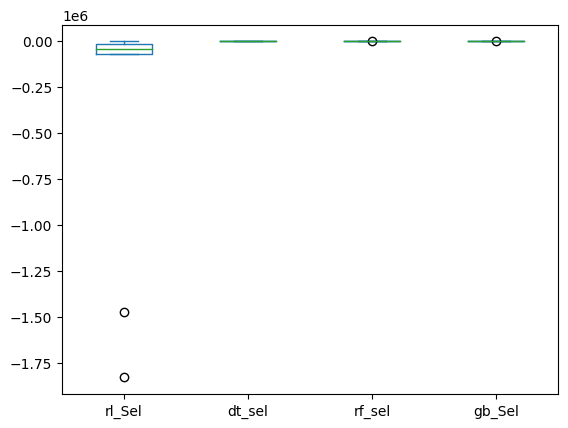

In [32]:
#grafico de rmse
rmse_X2.plot(kind='box') ### gráfico para modelo variables seleccionadas
rmse.mean()

In [ ]:
#del analisis anterior se concluye que los mejores modelos con variables seleccionadas son random forest, seguido de gradient boosting, se descarta la regresion linea, tiene un error promedio de prediccion muy alto y durnate el analisis exploratorio se evienciaron varios problemas de multicolinealidad

#Afinamiento de Hiperparametros

##random forest

In [55]:
#matriz de hiperparametros, se seleccionan los parametos por defecto mas algunos en un rango cercano y lejano. Se seleccionan pocas features ya que el modelo tiene bastantes caracteristicas
param_grid = [{'n_estimators': [800,1000,2000,6000], 'max_features': [10,5,30,80],
               'min_samples_split': [100, 20,15,10,5,2],'max_depth': [2,8,10]}]
#afinamiento por busqueda aleatoria para el modelo seleccionado de random forest
tun_rf=RandomizedSearchCV(m_rf,param_distributions=param_grid,n_iter=6,scoring="neg_root_mean_squared_error")
tun_rf.fit(X2,Y)

RandomizedSearchCV(estimator=RandomForestRegressor(), n_iter=6,
                   param_distributions=[{'max_depth': [2, 8, 10],
                                         'max_features': [10, 5, 30, 80],
                                         'min_samples_split': [100, 20, 15, 10,
                                                               5, 2],
                                         'n_estimators': [800, 1000, 2000,
                                                          6000]}],
                   scoring='neg_root_mean_squared_error')

In [56]:
#se muestran los resultados del afinamiento
pd.set_option('display.max_colwidth', 100)
resultados=tun_rf.cv_results_
tun_rf.best_params_
pd_resultados=pd.DataFrame(resultados)
pd_resultados[["params","mean_test_score"]].sort_values(by="mean_test_score", ascending=False)

,params,mean_test_score
2,"{'n_estimators': 6000, 'min_samples_split': 5, 'max_features': 30, 'max_depth': 8}",-8.332914
4,"{'n_estimators': 2000, 'min_samples_split': 5, 'max_features': 30, 'max_depth': 8}",-8.335805
1,"{'n_estimators': 6000, 'min_samples_split': 2, 'max_features': 80, 'max_depth': 2}",-8.478551
5,"{'n_estimators': 800, 'min_samples_split': 5, 'max_features': 5, 'max_depth': 10}",-8.573126
3,"{'n_estimators': 1000, 'min_samples_split': 5, 'max_features': 30, 'max_depth': 2}",-8.612204
0,"{'n_estimators': 2000, 'min_samples_split': 20, 'max_features': 30, 'max_depth': 2}",-8.619182


In [57]:
#se guarda el modelo con los hiperparametros seleccionados
rf_final=tun_rf.best_estimator_  #MODELO DE RANDOM FOREST


In [58]:
#ver aparte metricas de train y test para evaluar sobreajuste
eval=cross_validate(rf_final,X2,Y,cv=5,scoring="neg_root_mean_squared_error",return_train_score=True)

In [59]:
#con 5 validaciones cruzadas nos damos cuenta que el modelo tiene un sobreajuste bajo, pero un error alto
eval

{'fit_time': array([16.08012938, 17.26017785, 15.96433997, 15.83858776, 16.78148389]),
 'score_time': array([0.32155061, 0.3327558 , 0.3282733 , 0.32138896, 0.31400299]),
 'test_score': array([-9.66763583, -8.04125994, -8.81022089, -7.42689183, -7.68437867]),
 'train_score': array([-7.26779816, -7.64208463, -7.49213157, -7.77533008, -7.72154523])}

##gradient boost

In [64]:
#afinamiento por busqueda aleatoria para el modelo seleccionado de random forest
tun_gbt=RandomizedSearchCV(m_gbt,param_distributions=param_grid,n_iter=6,scoring="neg_root_mean_squared_error")
tun_gbt.fit(X2,Y)

RandomizedSearchCV(estimator=GradientBoostingRegressor(), n_iter=6,
                   param_distributions=[{'max_depth': [2, 8, 10],
                                         'max_features': [10, 5, 30, 80],
                                         'min_samples_split': [100, 20, 15, 10,
                                                               5, 2],
                                         'n_estimators': [800, 1000, 2000,
                                                          6000]}],
                   scoring='neg_root_mean_squared_error')

In [65]:
#se muestran los resultados del afinamiento
pd.set_option('display.max_colwidth', 100)
resultados=tun_gbt.cv_results_
tun_rf.best_params_
pd_resultados=pd.DataFrame(resultados)
pd_resultados[["params","mean_test_score"]].sort_values(by="mean_test_score", ascending=False)

,params,mean_test_score
3,"{'n_estimators': 2000, 'min_samples_split': 100, 'max_features': 80, 'max_depth': 10}",-6.878970
1,"{'n_estimators': 1000, 'min_samples_split': 15, 'max_features': 30, 'max_depth': 10}",-6.934264
0,"{'n_estimators': 6000, 'min_samples_split': 5, 'max_features': 5, 'max_depth': 8}",-7.112449
5,"{'n_estimators': 1000, 'min_samples_split': 2, 'max_features': 5, 'max_depth': 8}",-7.136664
4,"{'n_estimators': 6000, 'min_samples_split': 2, 'max_features': 80, 'max_depth': 10}",-7.196250
2,"{'n_estimators': 1000, 'min_samples_split': 5, 'max_features': 5, 'max_depth': 10}",-7.264654


In [66]:
#se guarda el modelo con los hiperparametros seleccionados
gbt_final=tun_gbt.best_estimator_  #MODELO DE RANDOM FOREST

In [67]:
#ver aparte metricas de train y test para evaluar sobreajuste
eval1=cross_validate(gbt_final,X2,Y,cv=5,scoring="neg_root_mean_squared_error",return_train_score=True)

In [68]:
#con 5 validaciones cruzadas nos damos cuenta que el modelo tiene un sobreajuste altisimo, por lo que prefiere el modelo de random forest.
eval1

{'fit_time': array([15.30502319, 20.23348117, 19.48568273, 16.84273791, 15.49627066]),
 'score_time': array([0.15691948, 0.10489655, 0.25856543, 0.10083175, 0.08949137]),
 'test_score': array([-8.07824661, -6.86923634, -7.18279926, -6.38999219, -6.25881873]),
 'train_score': array([-0.02821229, -0.03082367, -0.02974353, -0.02747917, -0.02573291])}